### Semi-autonomous Teleoperation Demo : Place task in `Kitchen Plate` scene with `small size dish rack`

### Parse `Realistic Scene`

In [1]:
import mujoco#,cv2,pyvista
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('../../../')
from utils.mujoco_parser import MuJoCoParserClass

from utils.util import sample_xyzs,rpy2r,r2rpy,r2quat,compute_view_params,get_interp_const_vel_traj, printmd
np.set_printoptions(precision=2,suppress=True,linewidth=100)
plt.rc('xtick',labelsize=6); plt.rc('ytick',labelsize=6)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("MuJoCo version:[%s]"%(mujoco.__version__))

MuJoCo version:[2.3.3]


In [2]:
xml_path = '../../../asset/scene_kitchen_dish_rack_black.xml'
env = MuJoCoParserClass(name='Place task scene: Plate table',rel_xml_path=xml_path,VERBOSE=False, MODE='window')
print(env.MODE)

# Move tables and robot base
env.model.body('base_table').pos = np.array([0,0,0])
env.model.body('base').pos = np.array([0.18,0,0.79])
env.model.body('avoiding_object_table').pos = np.array([0.38+0.45,0,0])
env.model.body('right_object_table').pos = np.array([-0.05,-0.80,0])
env.model.body('left_object_table').pos = np.array([-1.5,0.80,0])

# Place objects
obj_box_names = [body_name for body_name in env.body_names
             if body_name is not None and (body_name.startswith("obj_box"))]
n_box_obj = len(obj_box_names)
env.place_objects_random(n_obj=n_box_obj, obj_names=obj_box_names, x_range=[0.80, 1.15], y_range=[-3.15, -2.15], COLORS=False, VERBOSE=True)

jntadr_mug_cup = env.model.body('mug_cup').jntadr[0]
env.model.joint(jntadr_mug_cup).qpos0[:3] = np.array([ 0.9, -0.3, 0.85])
env.model.joint(jntadr_mug_cup).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, np.random.rand() * 360])))

jntadr_tray = env.model.body('tray').jntadr[0]
env.model.joint(jntadr_tray).qpos0[:3] = np.array([0.9,-0.3,0.80])
# env.model.joint(jntadr_tray).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, 0])))

jntadr_dish_rack = env.model.body('kitchen-drainer').jntadr[0]
pos_dish_rack = np.array([0.9,0.35,0.82])
env.model.joint(jntadr_dish_rack).qpos0[:3] = pos_dish_rack
dish_rack_random_rot = 0 # np.random.rand() * 360
env.model.joint(jntadr_dish_rack).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, dish_rack_random_rot])))


# Target dish
env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[:3] = np.array([0.2, -0.7, 0.8])
# Set the dishes
env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([0.,-0.06, 0.25])
env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))
env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([0., -0.12, 0.25])
env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))
env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([-3.5, 0., 0.25])
env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))

env.reset()

window


In [3]:
import openai 
import os 
import random 
random.seed(42)
import time 

s = time.time()
def gauss_2d(mu, sigma=0.01):
    x = random.gauss(mu[0], sigma)
    y = random.gauss(mu[1], sigma)
    return (x, y)

openai.api_key = 'your key' 
models = openai.Model.list()
# for model in models['data']:
#     print(model['id'])
print("Done.")

engine = "text-davinci-003"
prompt = '''
The goal is to place a plate in the kitchen. 
In terms of the symbolic spatial relationship between objects, 
a plate is suitable for placement on a dish rack. 
The rack has slots aligned along the y-axis

The center of mass of dish rack is placed on {x:0.9, y:0.35, z:0.82}m.
The dish rack size is {x:0.17, y:0.07, z:0.28}m.
The center of mass of Plate2 is placed in a rack where the coordinate is {x: 0.9, y: 0.29, z: 0.82}m.
The center of mass of Plate3 is placed in a rack where the coordinate is {x: 0.9, y: 0.23, z: 0.82}m.
The plate size is {x:0.14, y:0.02, z:0.14}m.

How many centimeters a plate should other plates be placed from the center of mass of dish rack?
'''

response = openai.Completion.create(engine='text-davinci-003',
                                   prompt=prompt,
                                   max_tokens = 512,
                                   temperature =1.0)
print("Answer: ", response["choices"][0]['text'])

for i in range(20):
    res = gauss_2d([0.9, 0.31],0.03)
print(time.time()-s)

Done.
Answer:  
The plates should be placed 7 centimeters apart from the center of mass of the dish rack. This is calculated by taking the total length of the dish rack (0.07m) and dividing by the number of plates (3) to get the distance (0.07/3=0.023m or 2.3cm) between each plate.
2.365072011947632


1. Result: (0.8974126846099115, 0.30118300666130404)
[ 0.5  -0.01  1.16]


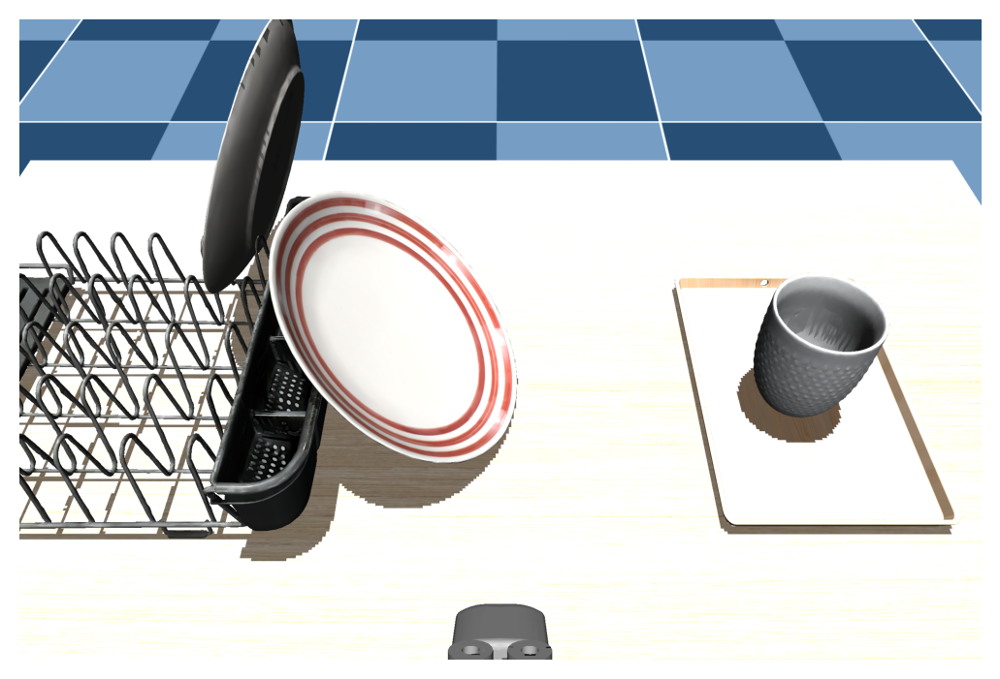

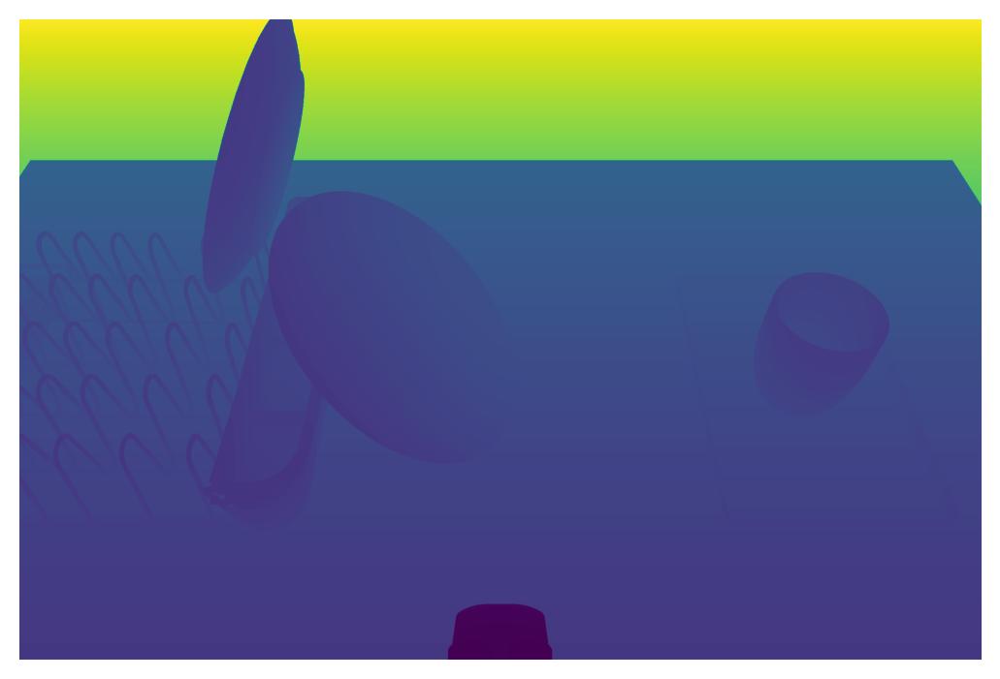

2. Result: (0.9034325957238276, 0.334559089346313)
[ 0.5  -0.01  1.16]


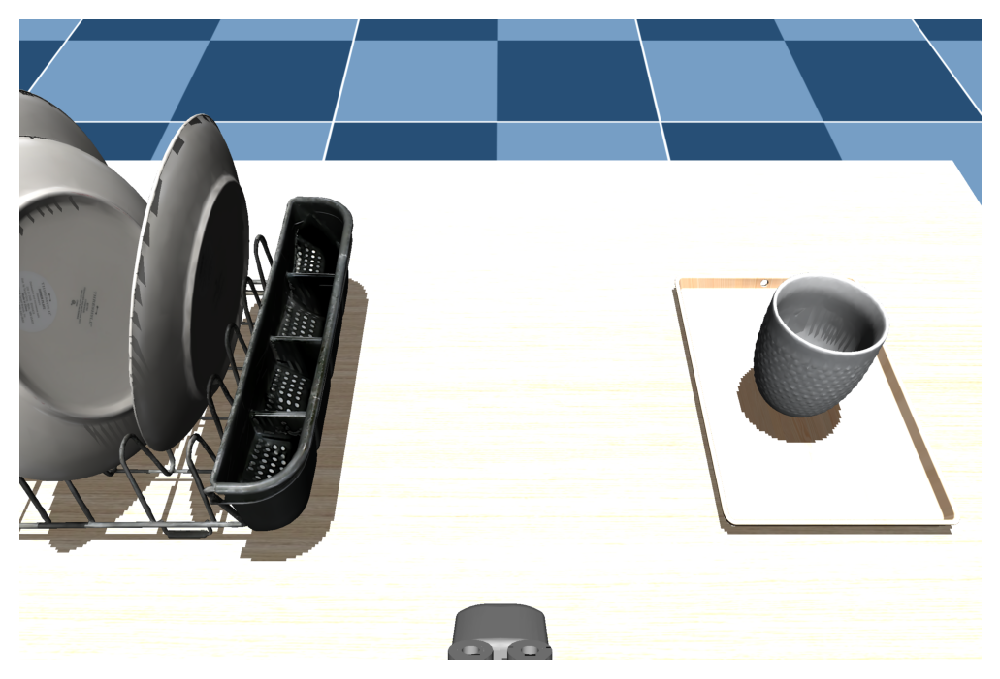

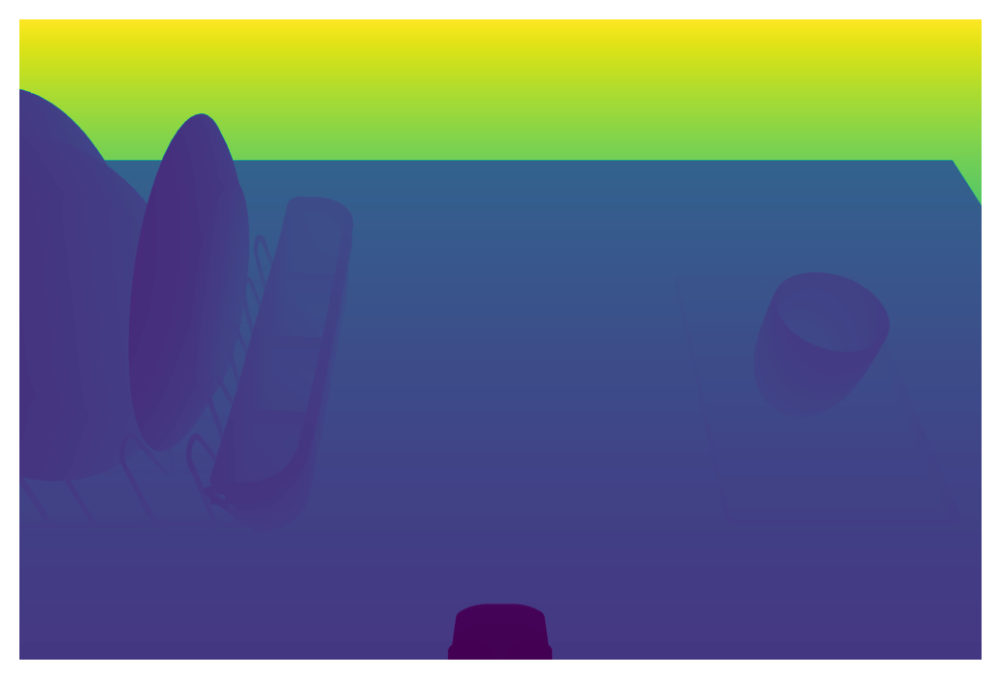

3. Result: (0.9191524137237733, 0.32049655305607627)
[ 0.5  -0.01  1.16]


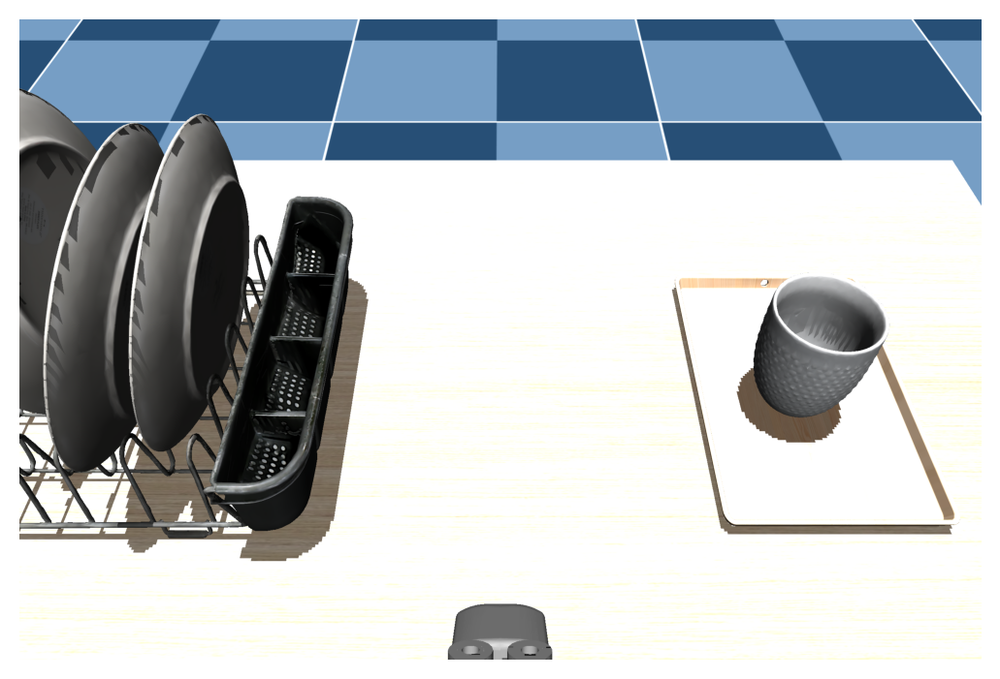

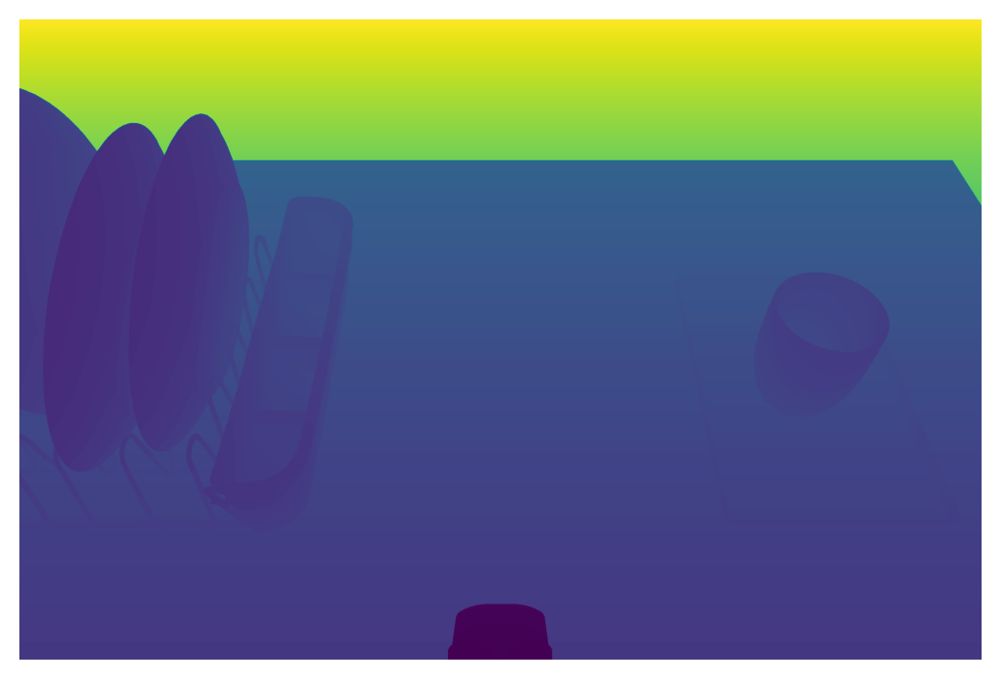

4. Result: (0.919498442934189, 0.32435476112950357)
[ 0.5  -0.01  1.16]


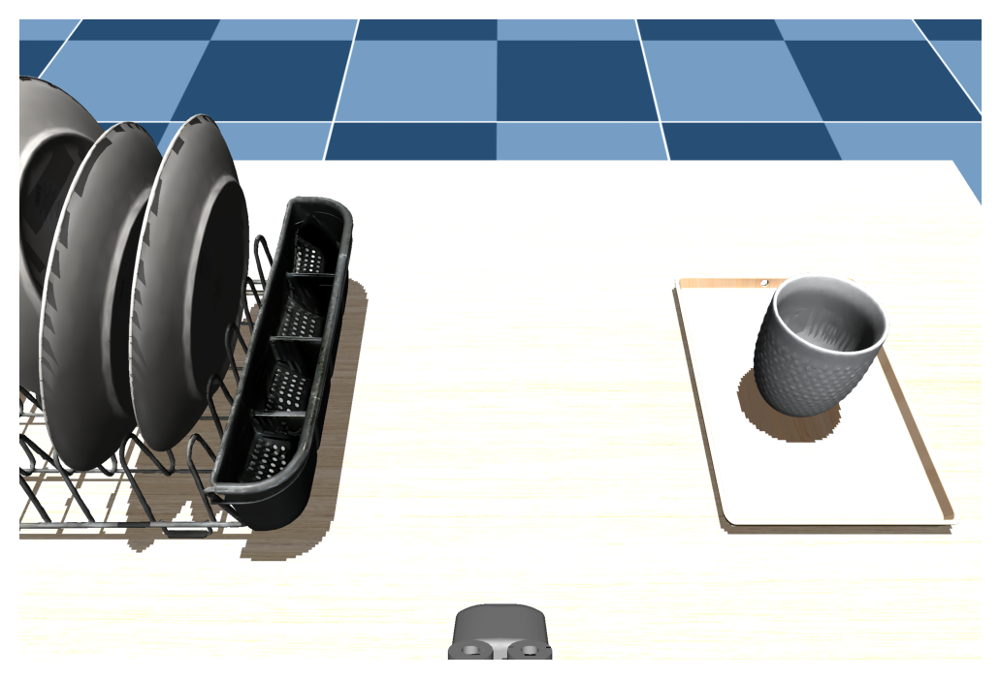

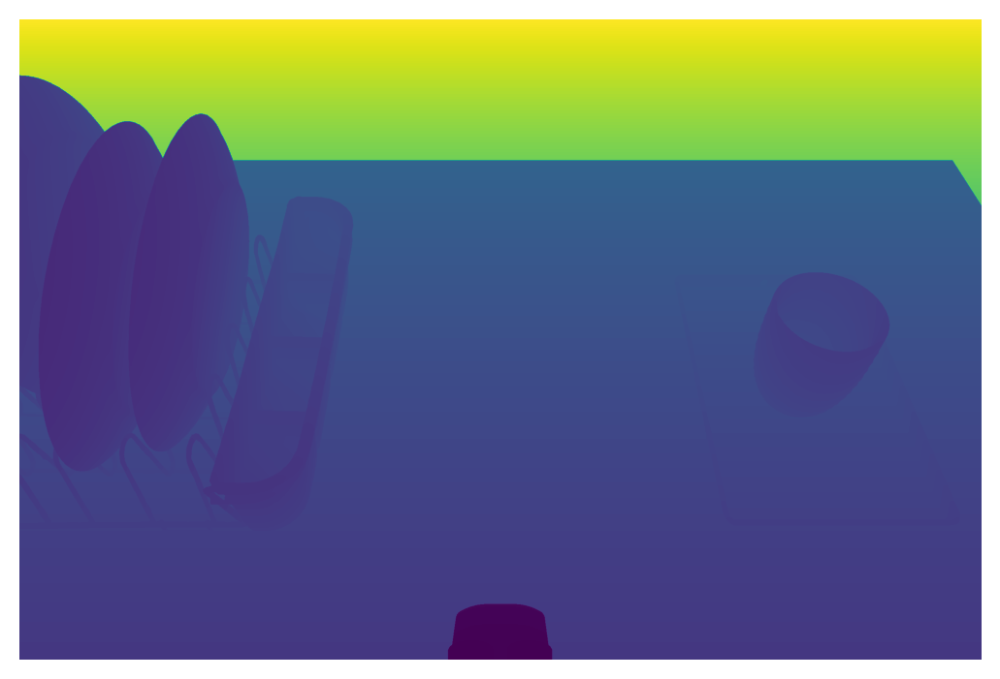

5. Result: (0.8811904360434121, 0.2884788671855027)
[ 0.5  -0.01  1.16]


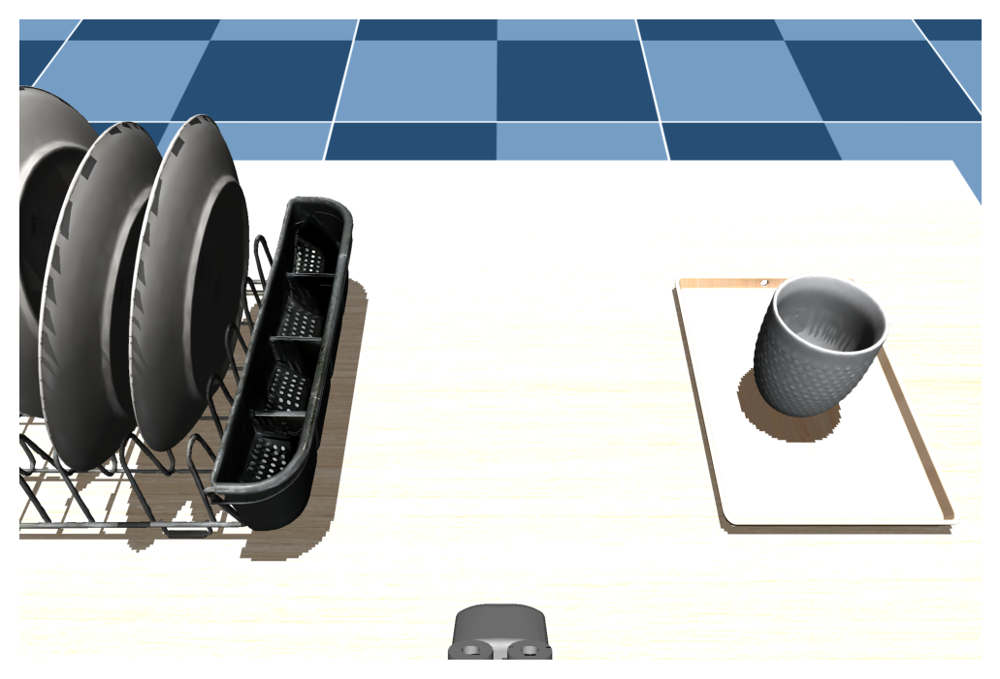

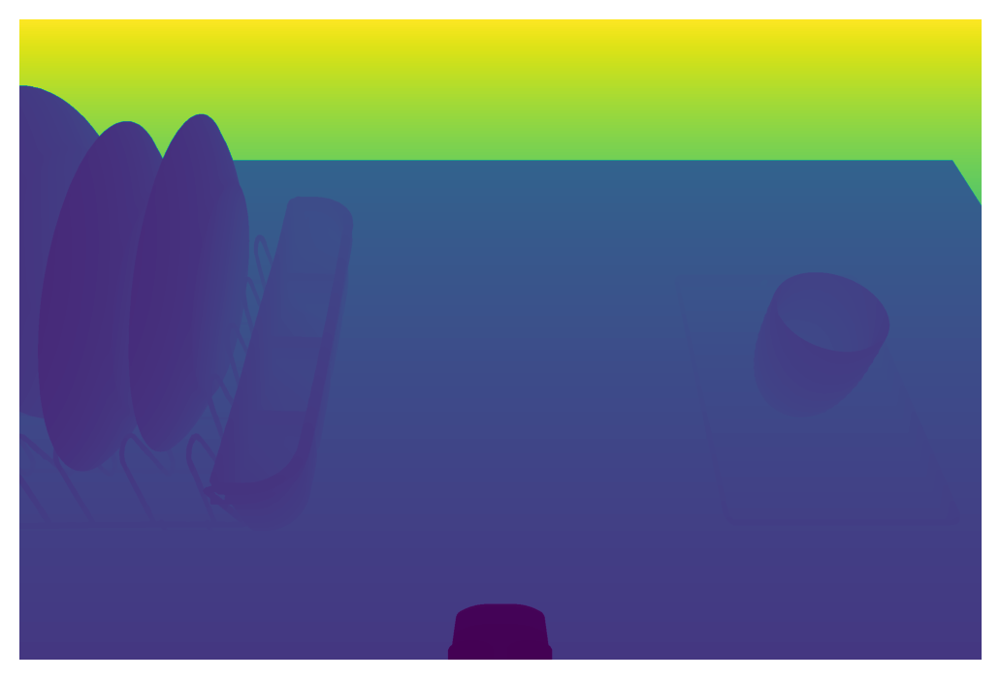

6. Result: (0.8859009517759197, 0.32497979201430344)
[ 0.5  -0.01  1.16]


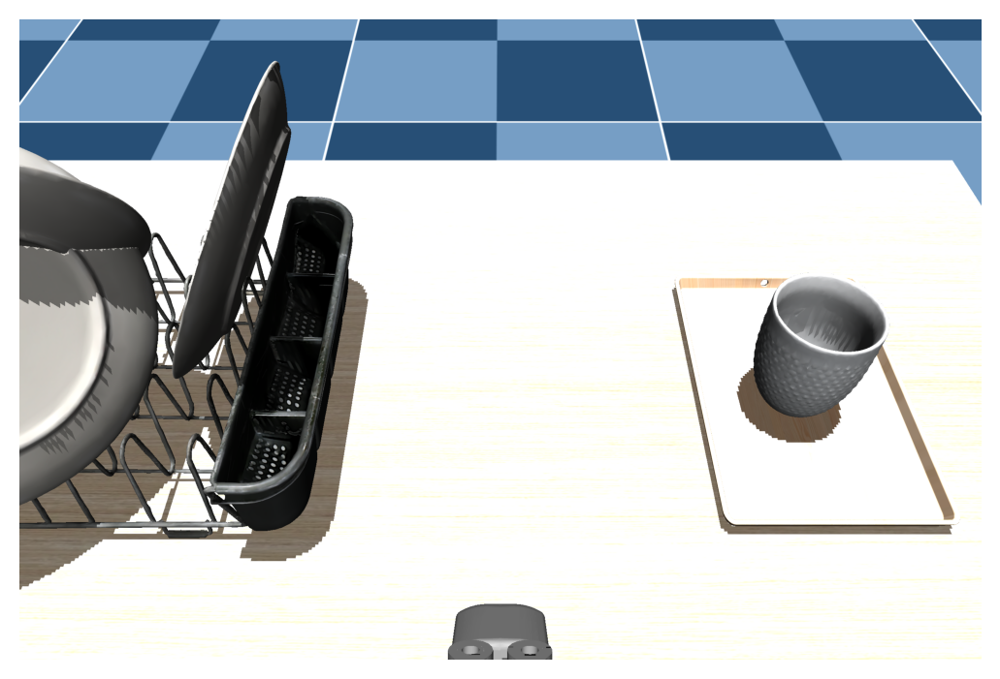

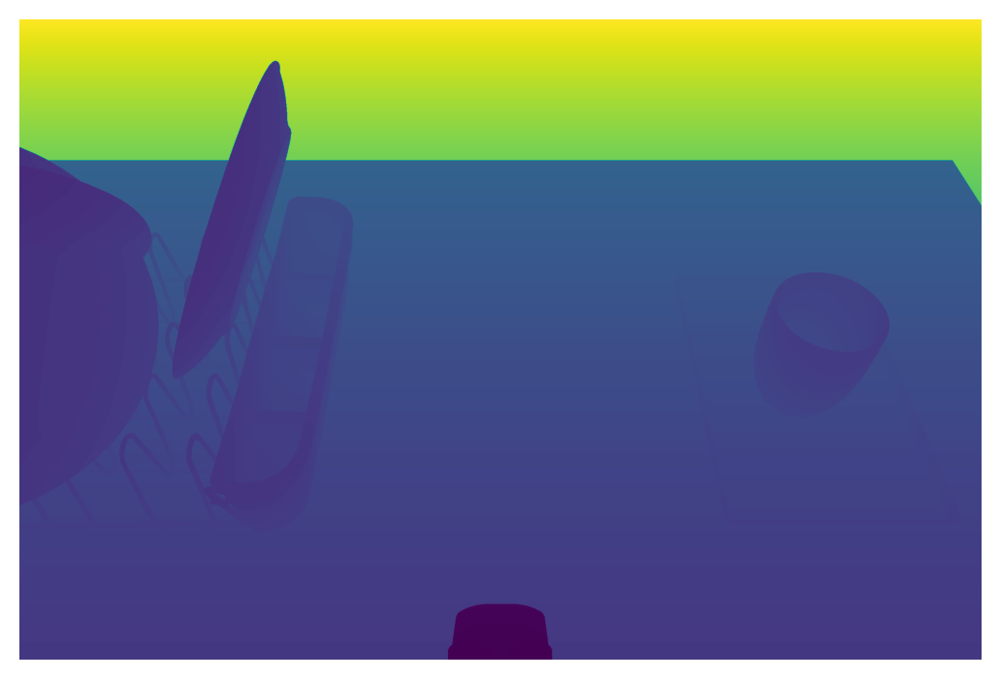

7. Result: (0.8924965328700785, 0.38007262667441644)
[ 0.5  -0.01  1.16]


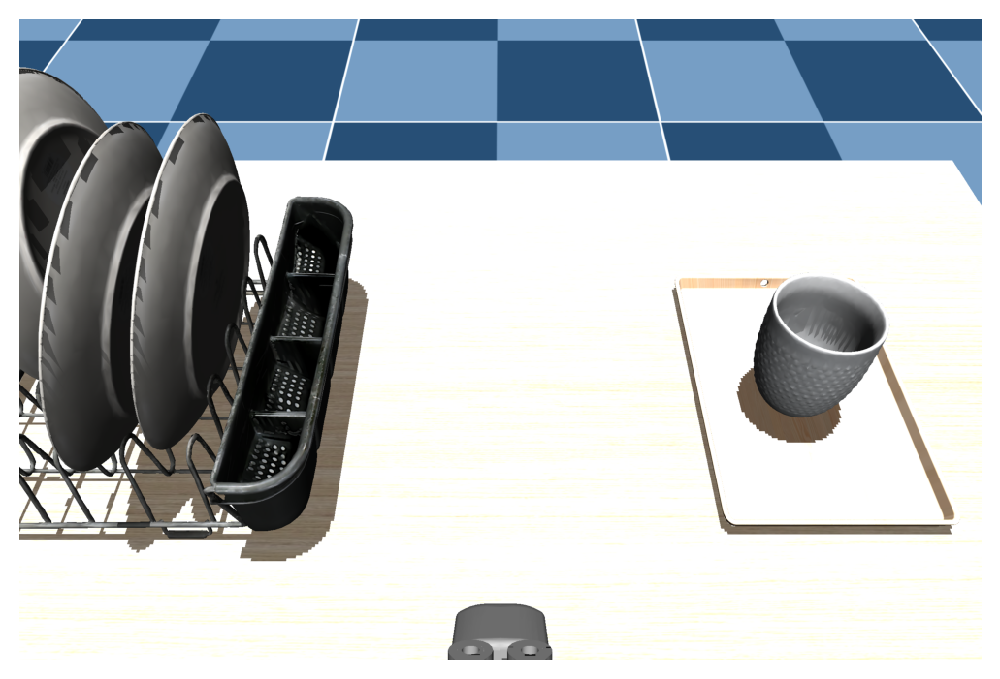

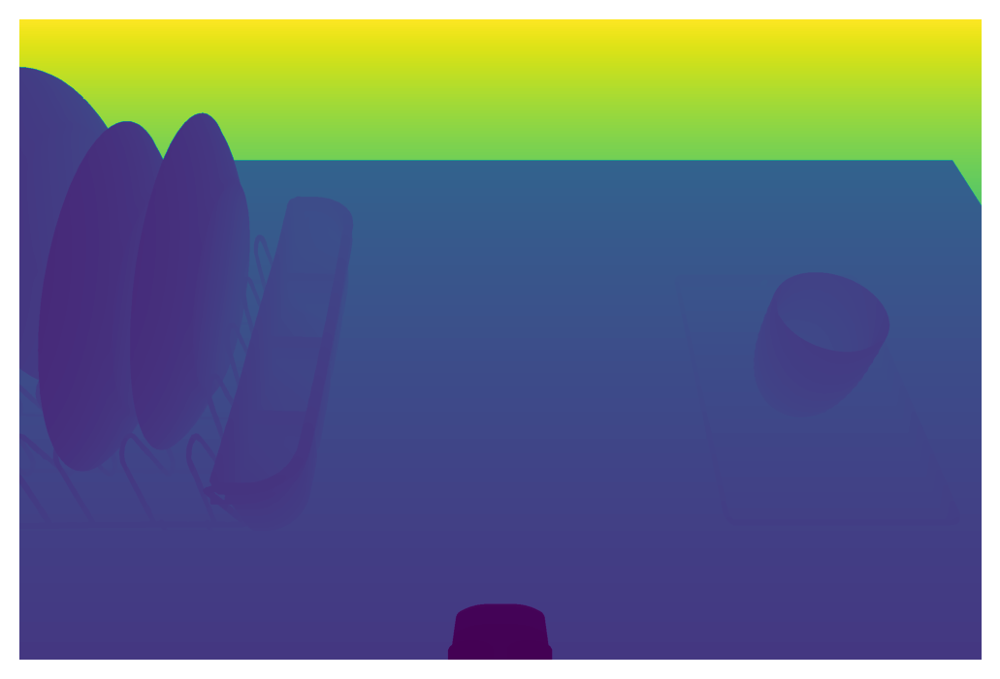

8. Result: (0.8754212237344052, 0.2770337620029353)
[ 0.5  -0.01  1.16]


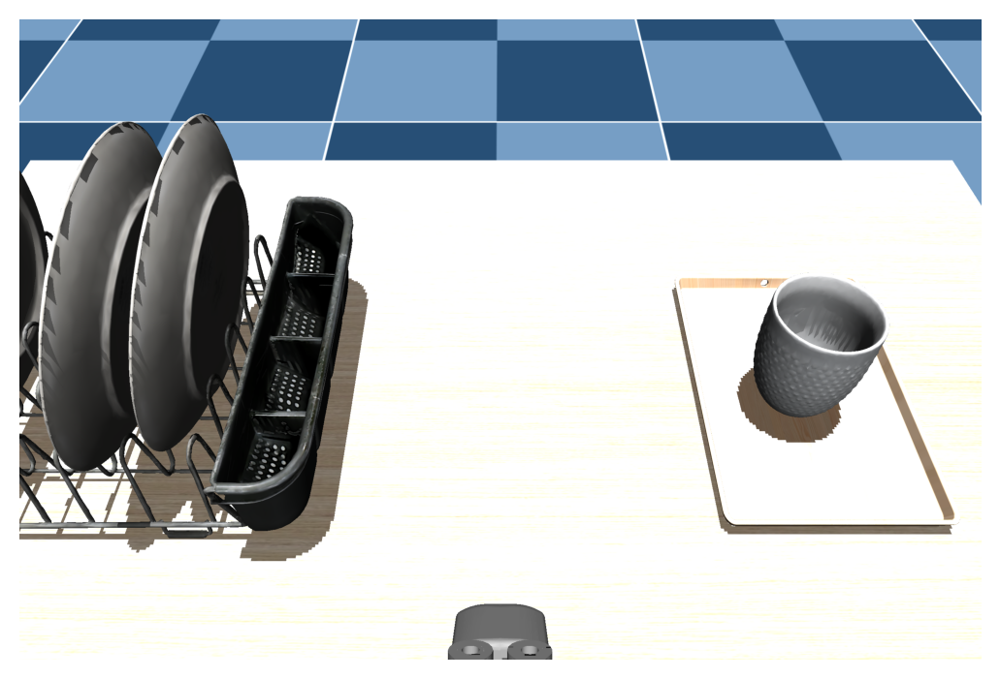

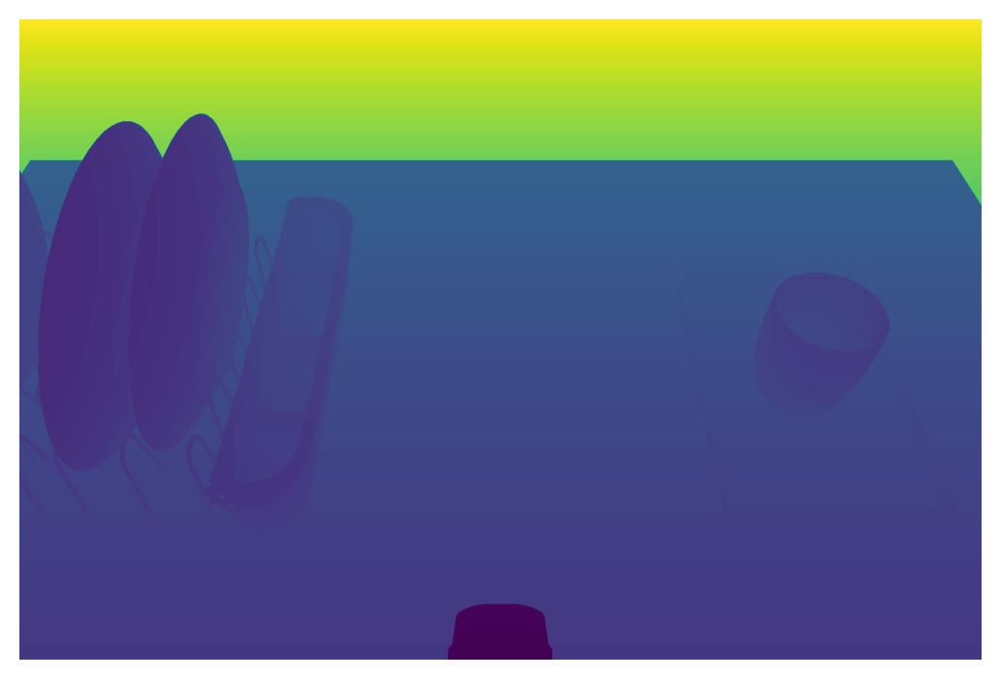

9. Result: (0.9230542054640909, 0.35265549944030394)
[ 0.5  -0.01  1.16]


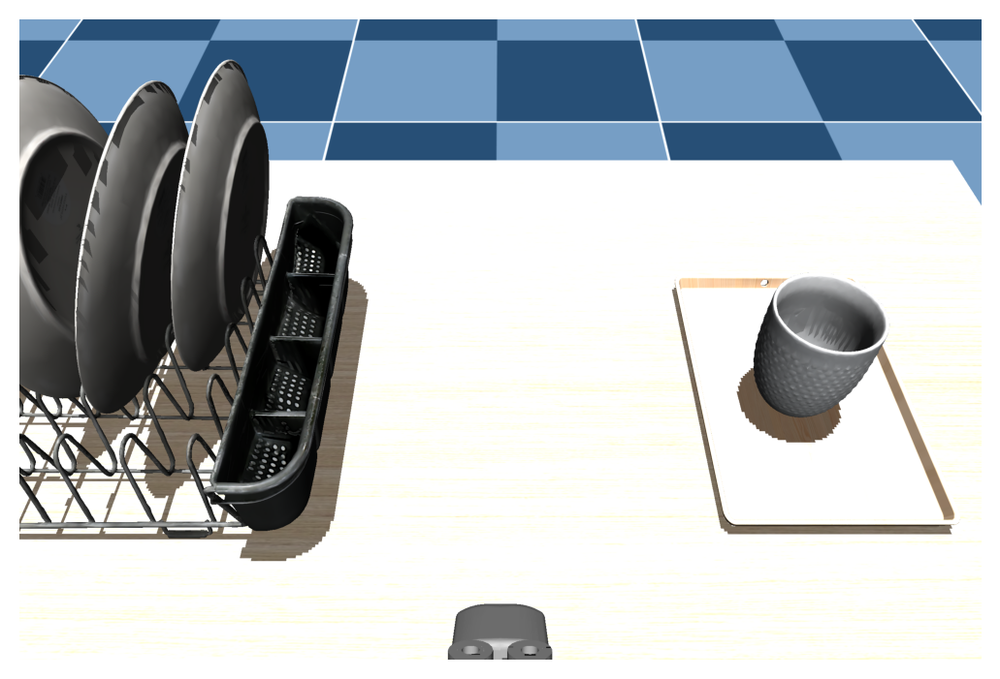

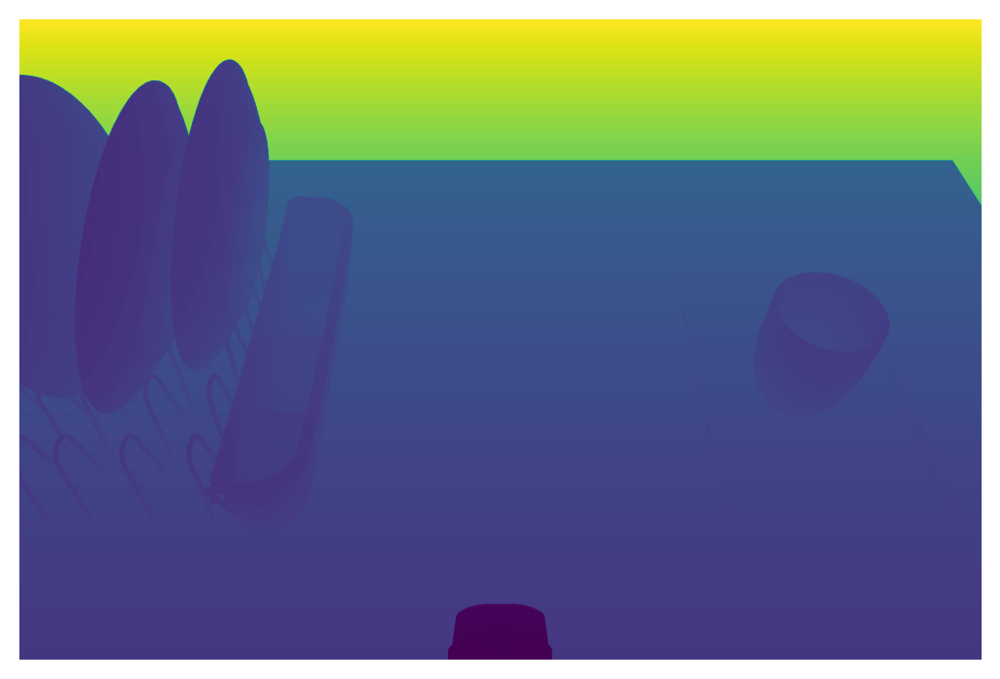

10. Result: (0.9151707807251778, 0.3350745203790302)
[ 0.5  -0.01  1.16]


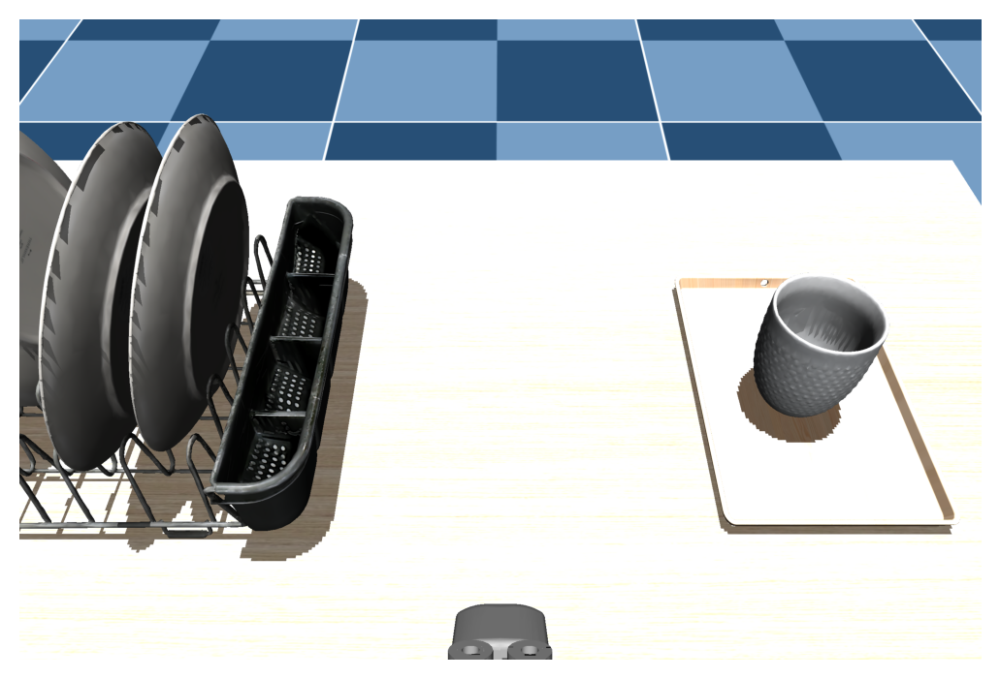

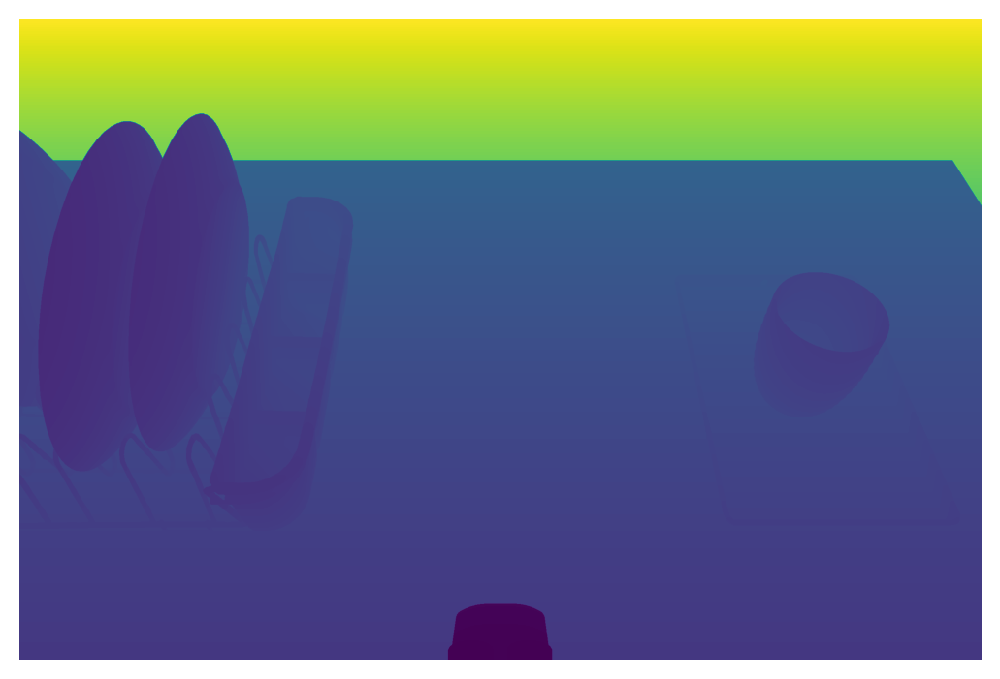

11. Result: (0.9427903493232649, 0.30717917571951087)
[ 0.5  -0.01  1.16]


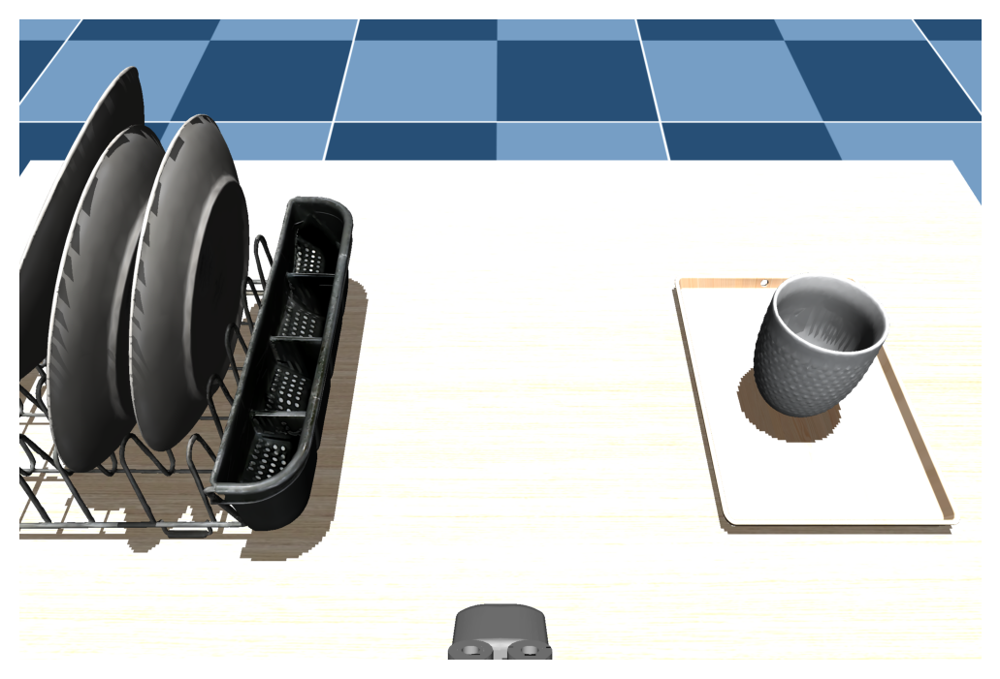

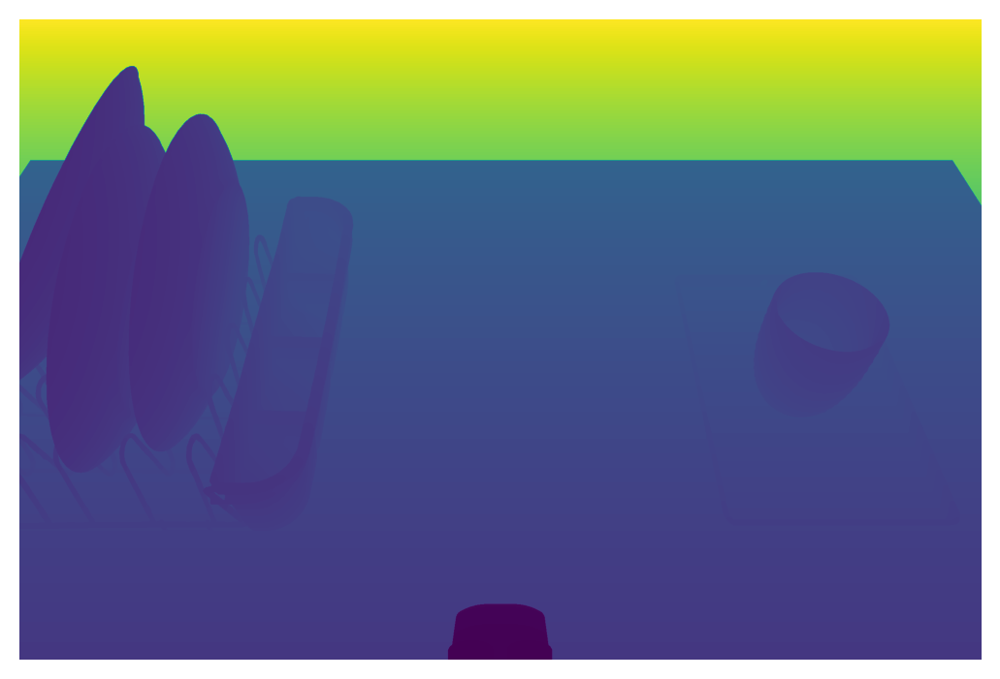

12. Result: (0.8573112320058307, 0.2940377035504386)
[ 0.5  -0.01  1.16]


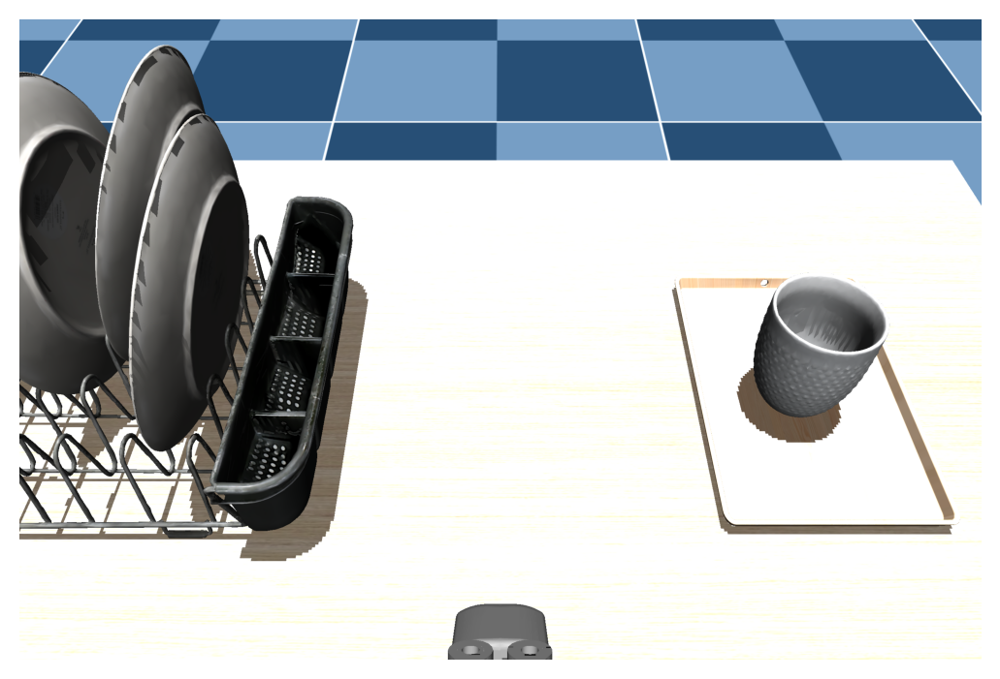

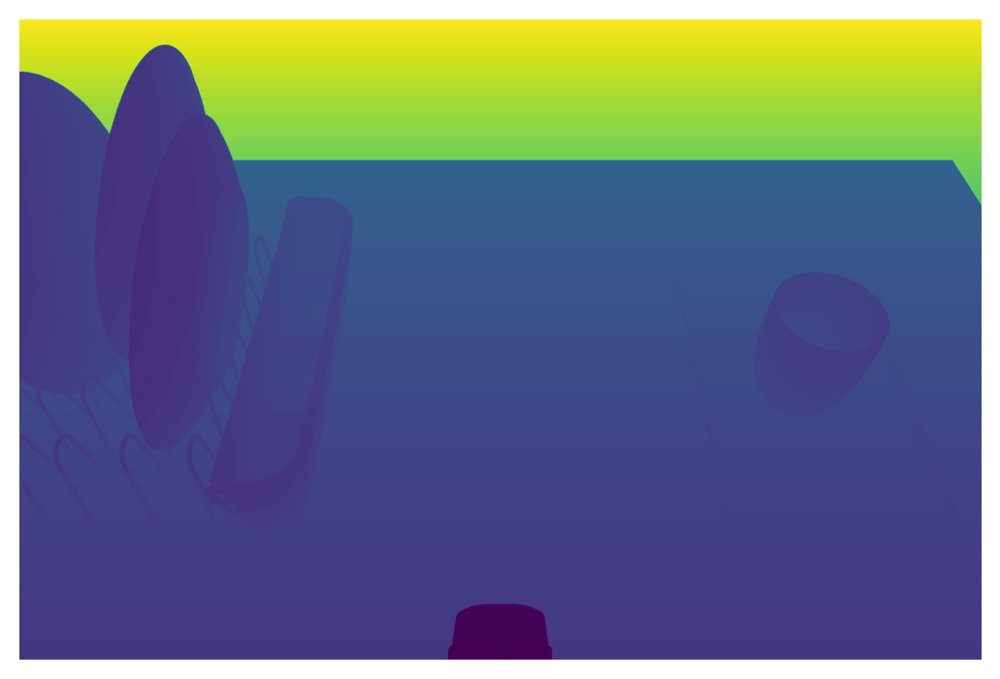

13. Result: (0.9285868727194974, 0.26668964781765137)
[ 0.5  -0.01  1.16]


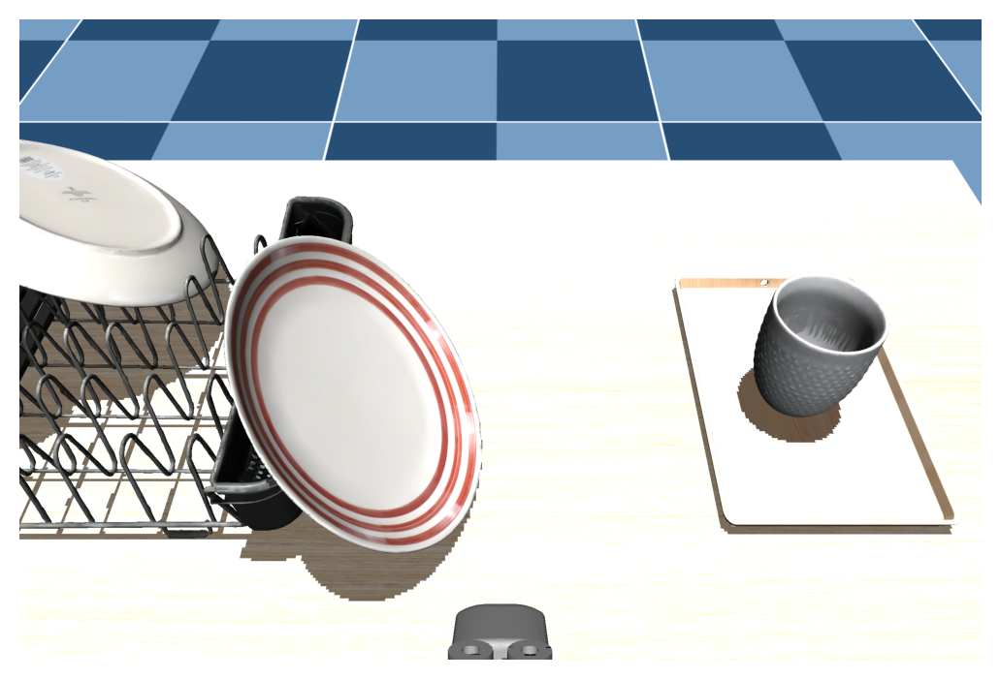

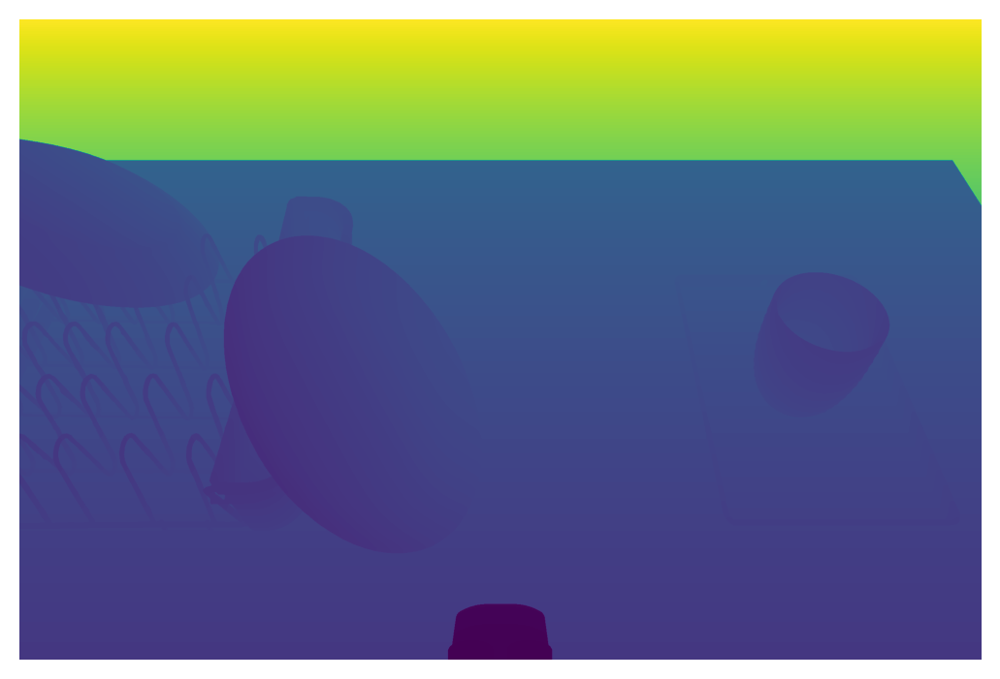

14. Result: (0.9010059396236179, 0.31759712078026187)
[ 0.5  -0.01  1.16]


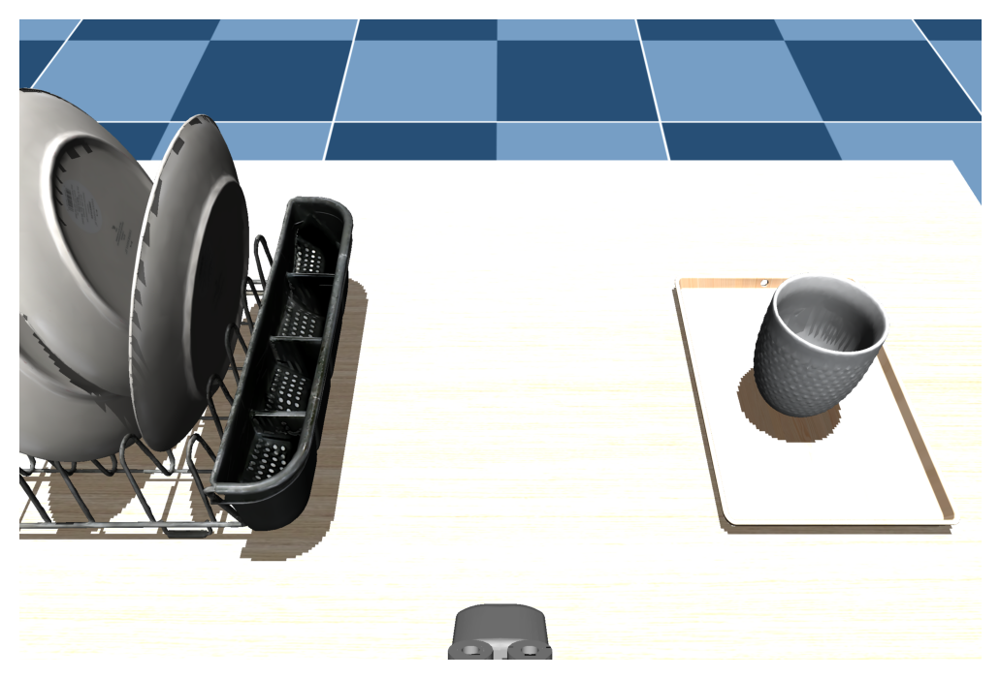

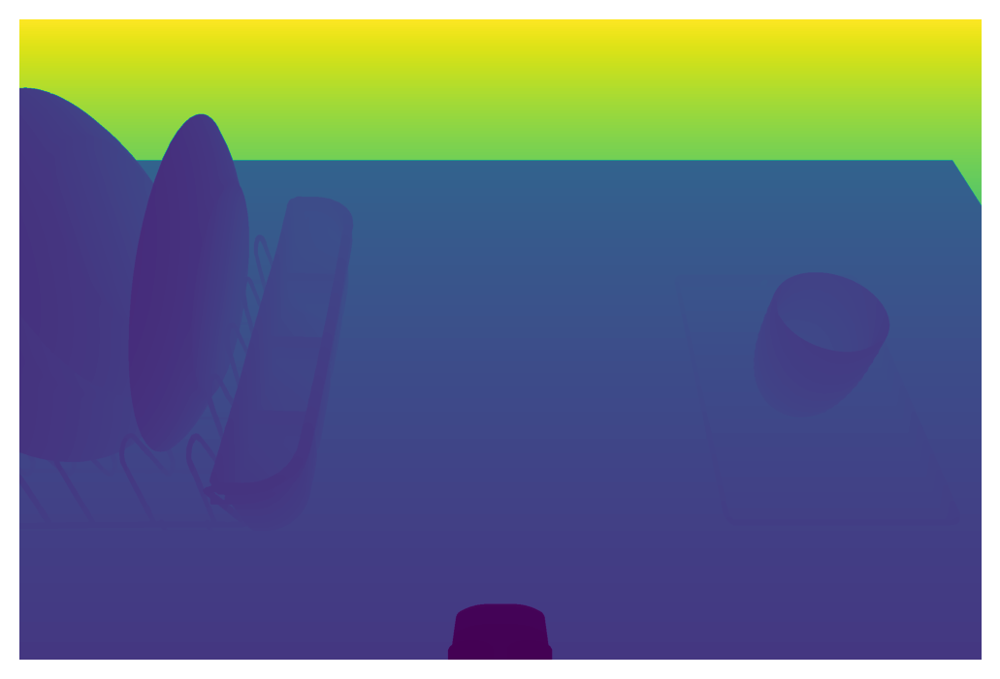

15. Result: (0.8905322350555899, 0.3317089595910429)
[ 0.5  -0.01  1.16]


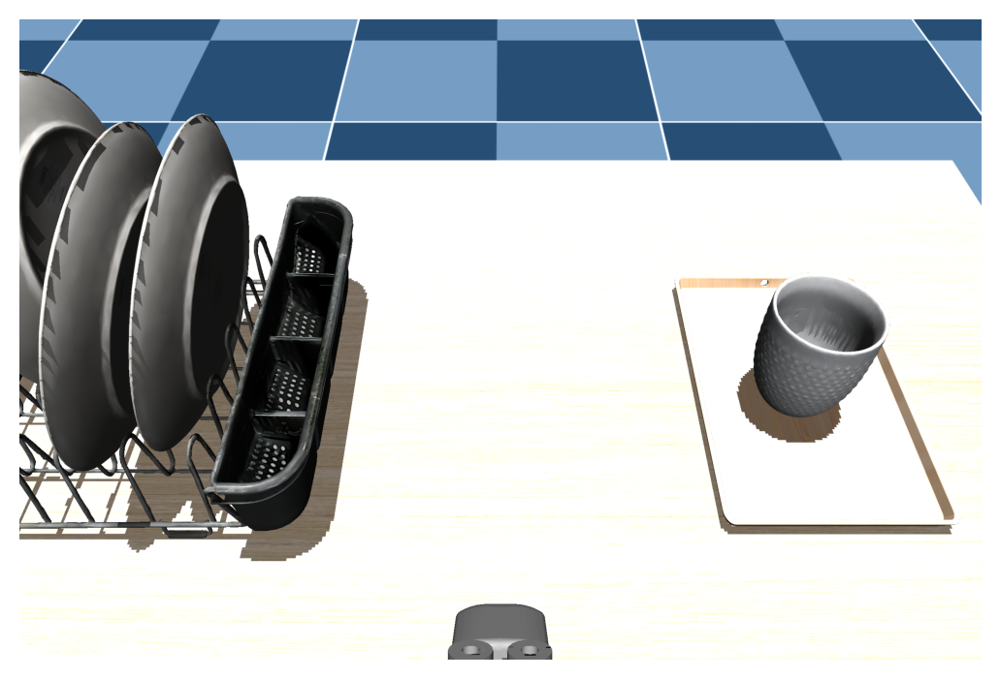

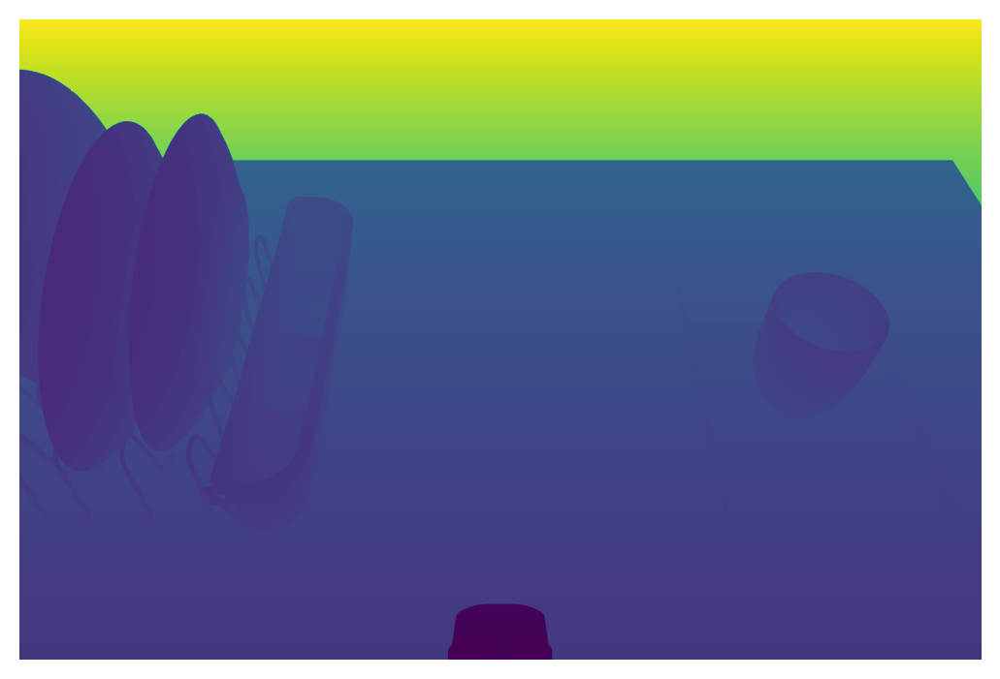

16. Result: (0.917423392245797, 0.3796422555070219)
[ 0.5  -0.01  1.16]


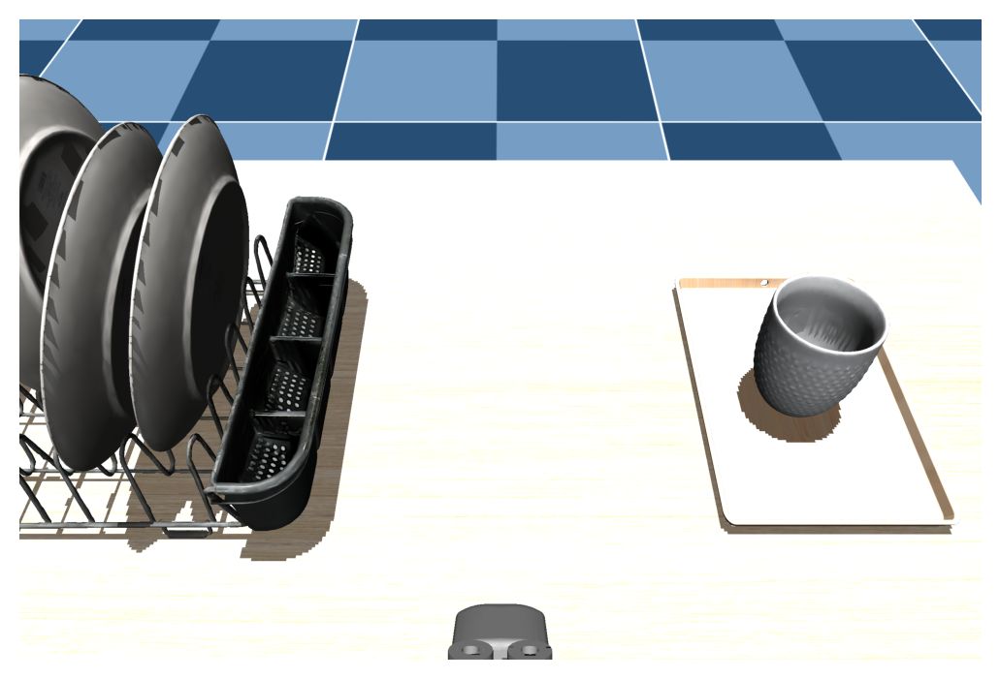

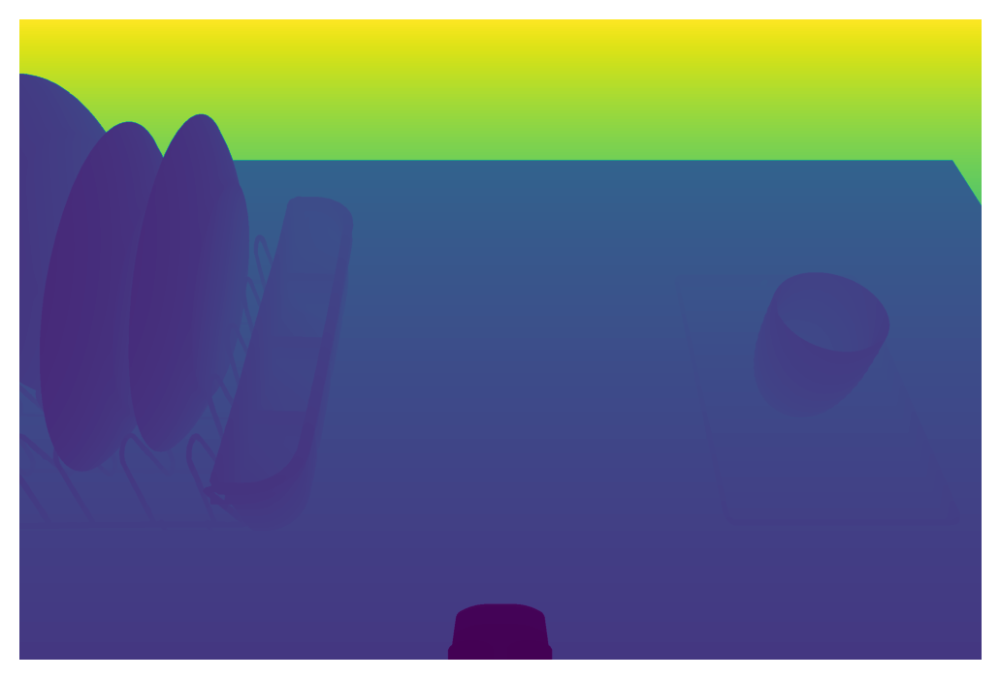

17. Result: (0.9185990330331941, 0.29171789624070815)
[ 0.5  -0.01  1.16]


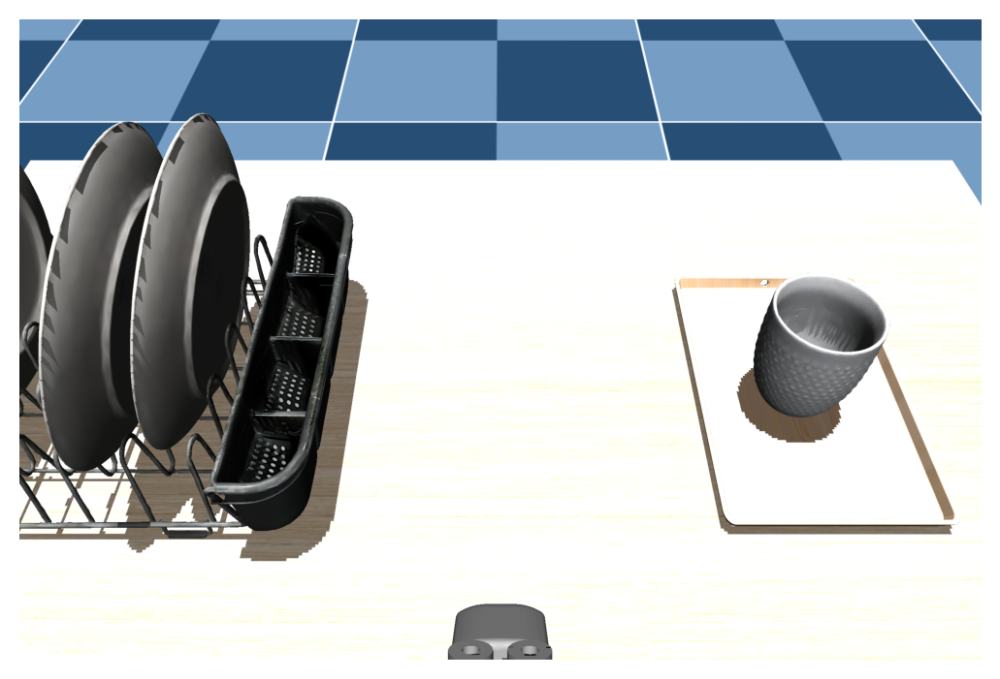

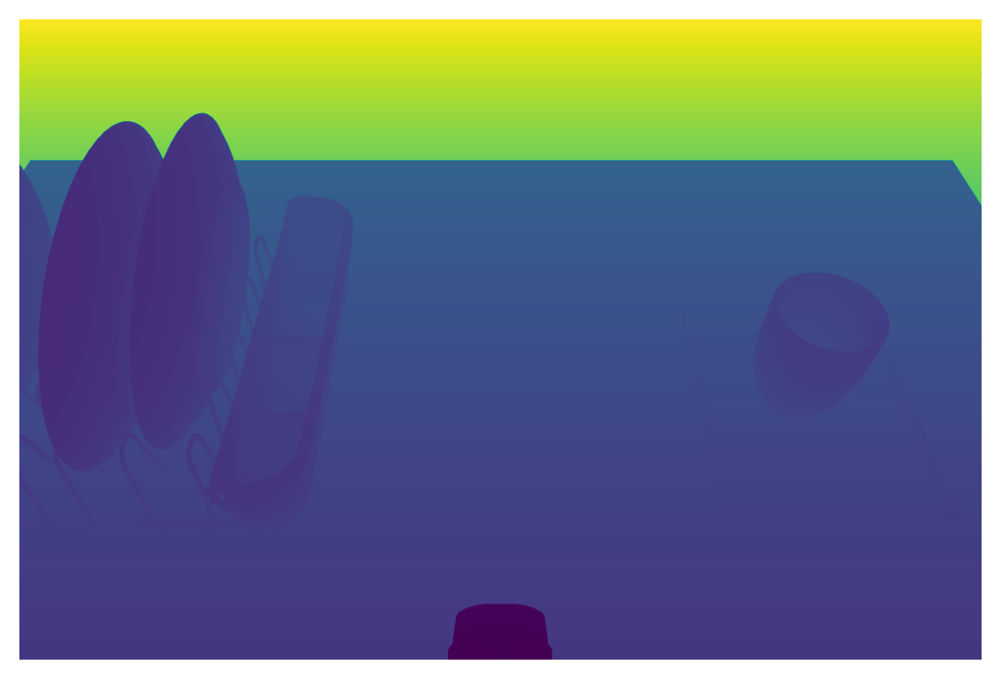

18. Result: (0.8831460722299791, 0.2850525669627398)
[ 0.5  -0.01  1.16]


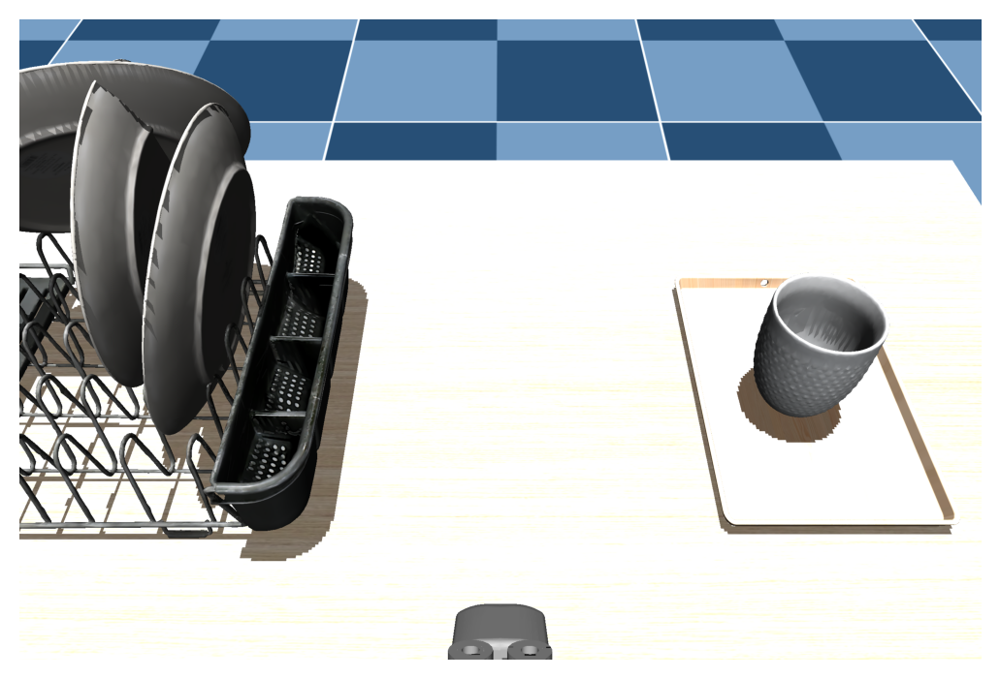

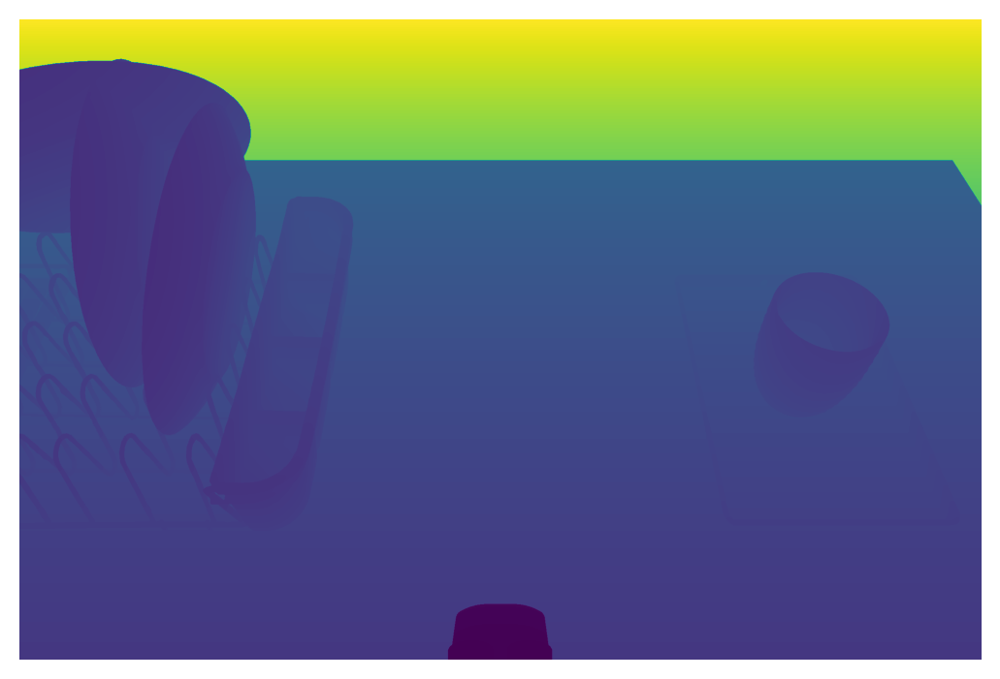

19. Result: (0.9285682067944746, 0.292995014955589)
[ 0.5  -0.01  1.16]


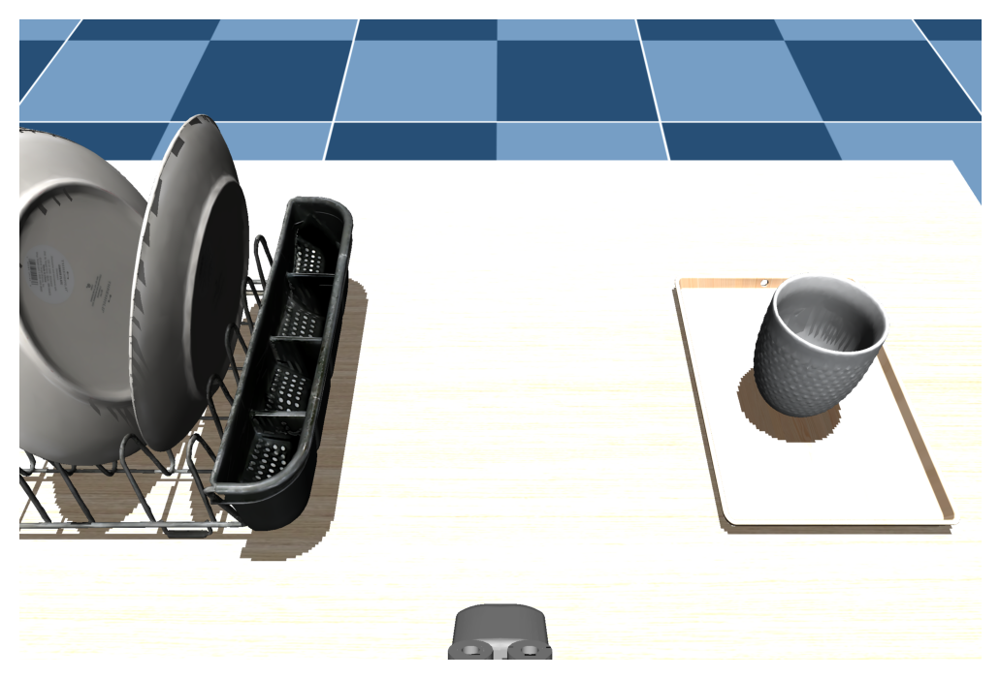

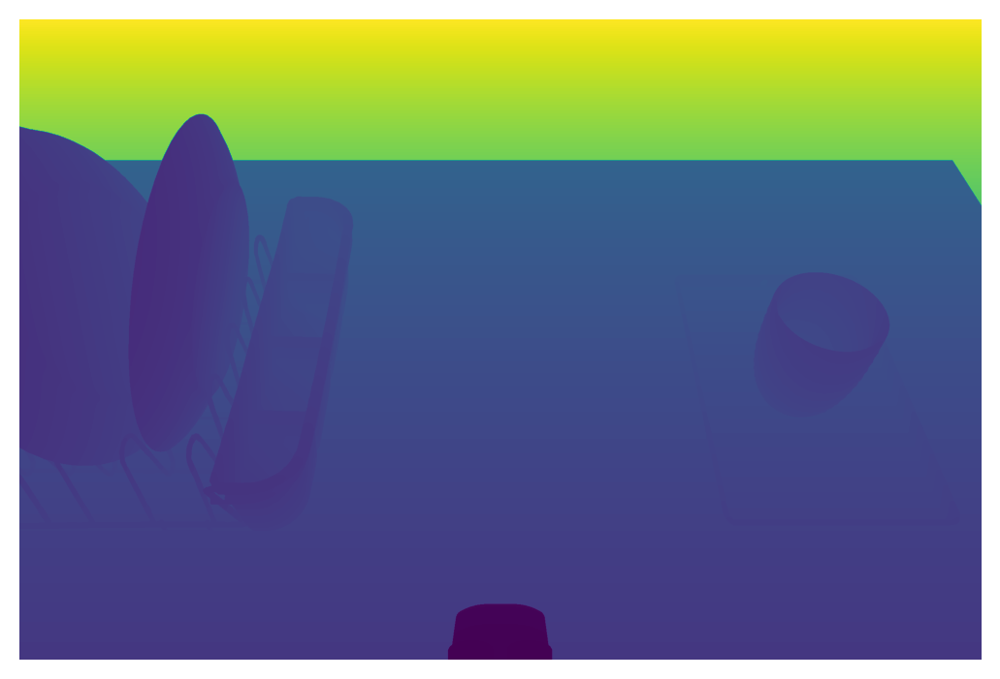

20. Result: (0.8978921767889821, 0.33247907857869025)
[ 0.5  -0.01  1.16]


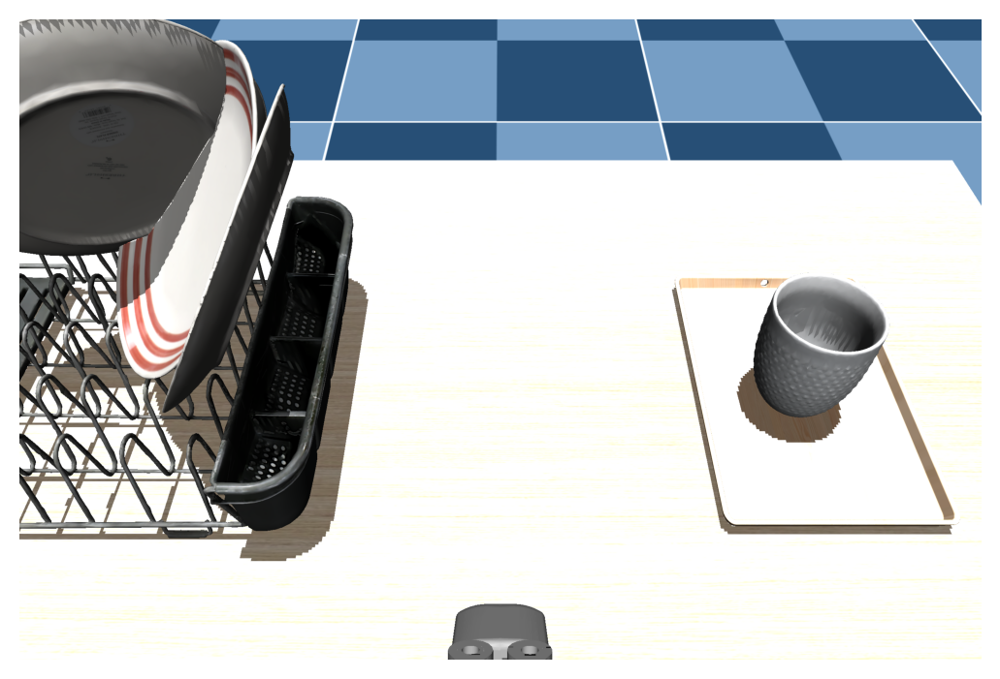

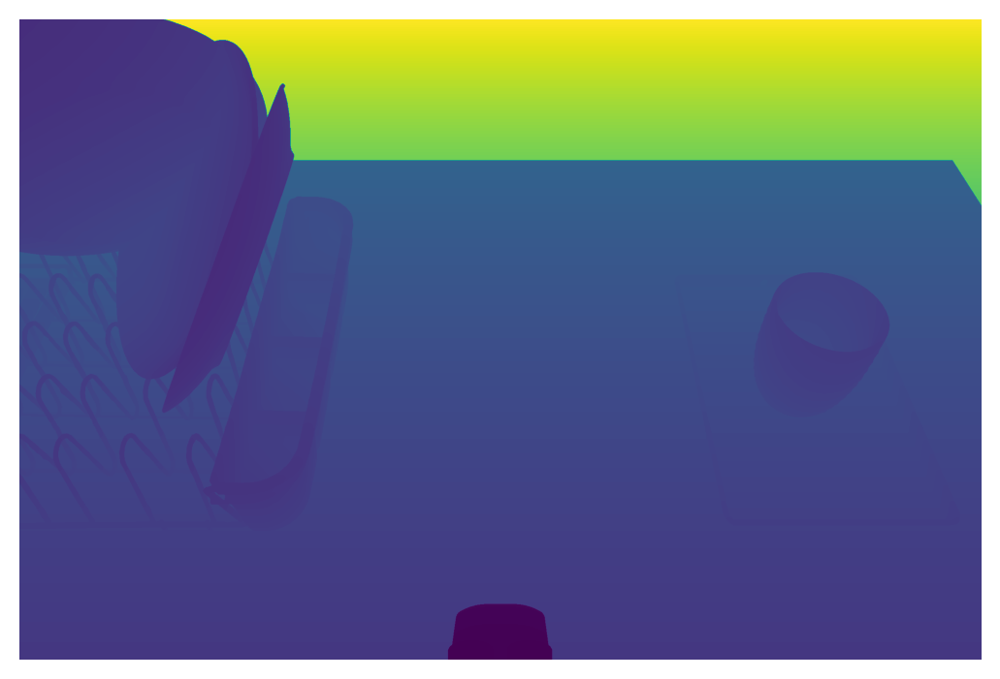

Done. Tick:[1001] Time:[2.00]sec


In [5]:
for i in range(20):
    res = gauss_2d([0.9, 0.31],0.03)
    print("{}. Result: {}".format(i+1,res))
    # Init viewer
    env.init_viewer(viewer_title='UR5e with RG2 gripper',viewer_width=1200,viewer_height=800,
                    viewer_hide_menus=True, MODE='window')
    env.update_viewer(azimuth=30,distance=3.0,elevation=-30,lookat=[1.0,0.0,0.71],
                    VIS_TRANSPARENT=False,VIS_CONTACTPOINT=False,
                    contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
                    VIS_JOINT=False,jointlength=0.25,jointwidth=0.05,jointrgba=[0.2,0.6,0.8,0.6])

    pcd_tick = 0

    # Reset
    env.reset()
    init_ur_q = np.array([np.deg2rad(-90), np.deg2rad(-130), np.deg2rad(120), np.deg2rad(100), np.deg2rad(45), np.deg2rad(-90)])
    env.forward(q=init_ur_q, joint_idxs=env.idxs_forward)
    initial_xyz = env.get_p_body('tcp_link')
    print(env.get_p_body('tcp_link'))
    tick,max_sec = 0,2


    # Target dish
    env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[:3] = np.array([res[0], res[1], 0.82+0.25])
    env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 90])))
    while env.get_sim_time() <= max_sec:
        env.step(ctrl=init_ur_q,ctrl_idxs=env.idxs_step)
        if not env.is_viewer_alive(): break
        # Render
        if env.loop_every(HZ=20):
            # Compute some poses
            p_tcp,R_tcp = env.get_pR_body(body_name='tcp_link')
            p_cam,R_cam = env.get_pR_body(body_name='camera_center')
            p_base,R_base = env.get_pR_body(body_name='base')
            # Get PCD from a specific view
            p_ego  = p_cam
            p_trgt = p_cam + R_cam[:,2] + np.array([0,0,-0.1])
            rgb_img,depth_img,pcd,xyz_img = env.get_egocentric_rgb_depth_pcd(
                p_ego=p_ego,p_trgt=p_trgt,rsz_rate=40,fovy=45,BACKUP_AND_RESTORE_VIEW=True)
            env.render(render_every=1)
    plt.imshow(rgb_img); plt.axis('off'); plt.show()
    plt.imshow(depth_img); plt.axis('off'); plt.show()
    p_dish2, R_dish2 = env.get_pR_body(body_name='kitchen-plate-2')

    # Close viewer
    env.close_viewer()
print ("Done. Tick:[%d] Time:[%.2f]sec"%(env.tick,env.get_sim_time()))